#  Machine Learning Practice

In this study, a dataset with 108 features is used to predict one of nine classes. There is no specific explanation about the columns in the dataset. All columns are in numeric format. 

## Importing Libraries and Datasets

Required libraries are added in the implementation. Mostly a well-known ML library called sklearn is employed in this work. In order to optimize hyperparameters of some techniques such as LightLGM, a library called Optuna is used.

The libraries below are for general purposes such as data frame manipulation, using math functions, formatting etc.

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np
import warnings
from math import floor
warnings.filterwarnings('ignore')

I have mostly employed machine learning techniques from sklearn library. One can see the used approaches in this work by looking at the cell below. 

In [2]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.naive_bayes import GaussianNB 
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression

This part is mostly for the evaluation of the approaches we have applied. For example we need to import confusion matrix feature from sklearn.metrics in order to have more detailed information rather than only looking at the accuracy score. 

log_loss performance metric has been also used in this work in order to evaluate out performances in a wider perspective.

In [3]:
from sklearn.ensemble import StackingClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import accuracy_score, log_loss, roc_auc_score, roc_curve
from sklearn.metrics import make_scorer, accuracy_score
from sklearn.feature_selection import VarianceThreshold
from sklearn.model_selection import GridSearchCV
from mlxtend.plotting import plot_confusion_matrix #for a colorful confusion matrix

The libraries are mostly imported for special-purposes. For example lightgbm is a method of which we have taken advantage in this work. The results are promising. 

On the other hand, I have tried to take advantage of the hyper-parameter optimization libraries such as optuna in this example. bayes_opt can also be used for this purpose. Especially when optimizing the parameters of a neural network.

In [4]:
import lightgbm as lgb
from sklearn.manifold import TSNE
import optuna #Optuna is an automatic hyperparameter optimization software framework, particularly designed for machine learning.
from optuna.samplers import TPESampler
import pickle
import sklearn

In [5]:
from plotly.offline import plot, iplot, init_notebook_mode
init_notebook_mode(connected=True)
import plotly.express as px
import plotly.graph_objects as go

import plotly.io as pio

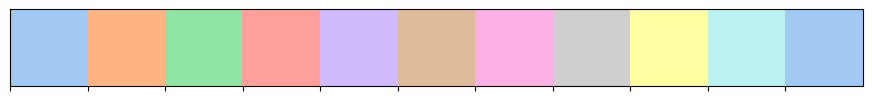

In [6]:
sns.palplot(sns.color_palette('pastel', 11))
colors = sns.color_palette('pastel', 10)

Versions of the libraries used in this study can be seen below.

In [7]:
# version of the libraries
print('pandas version: ' , pd.__version__)
print('seaborn version: ' , sns.__version__)
print('numpy version: ' , np.__version__)
print('optuna version: ' , optuna.__version__)
print('lgb version: ' , lgb.__version__)
print('sklearn version: ' , sklearn.__version__)

pandas version:  2.0.3
seaborn version:  0.12.2
numpy version:  1.24.3
optuna version:  3.6.1
lgb version:  4.3.0
sklearn version:  1.2.2


In [8]:
train_data = pd.read_csv('train_data.csv')

print('number of data points in the train data: ' , len(train_data))
print('shape of the train data: ' , train_data.shape)

number of data points in the train data:  62500
shape of the train data:  (62500, 109)


In [9]:
train_data.head(5)

,x_1,x_2,x_3,x_4,x_5,x_6,x_7,x_8,x_9,x_10,...,x_100,x_101,x_102,x_103,x_104,x_105,x_106,x_107,x_108,y
0,0.0,0.0,0.0,0.2,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.2,0.0,0.0,0.0,0.0,0.0,0.0,3
1,0.2,0.8,0.0,0.0,0.0,0.0,0.6,0.2,0.0,0.0,...,0.2,0.0,0.8,0.0,0.0,0.0,0.0,0.0,0.0,9
2,0.0,0.0,0.0,0.4,0.0,0.0,3.2,0.0,0.0,0.0,...,0.0,0.0,0.6,0.0,0.0,0.0,0.0,0.0,0.0,3
3,0.0,0.0,0.2,0.0,0.0,0.0,0.2,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
4,0.0,0.0,0.4,0.0,0.0,0.0,0.4,0.0,0.0,0.6,...,0.0,0.0,0.0,0.6,0.2,0.0,0.0,0.2,0.0,9


## Prechecking

One should check whether we are working with an imbalance dataset

In [13]:
class_counts = train_data['y'].value_counts()
class_percentages = class_counts / len(train_data) * 100
# create a pie chart by using plotly that shows the class distribution 

fig = px.pie(values=class_percentages, names=class_counts.index)
fig.show()

### Correlation among Features

In [14]:
import scipy
import scipy.cluster.hierarchy as sch

In [15]:
X = train_data.corr().values
d = sch.distance.pdist(X)  
L = sch.linkage(d, method='complete')
ind = sch.fcluster(L, 0.5*d.max(), 'distance')
columns = [train_data.columns.tolist()[i] for i in list((np.argsort(ind)))]

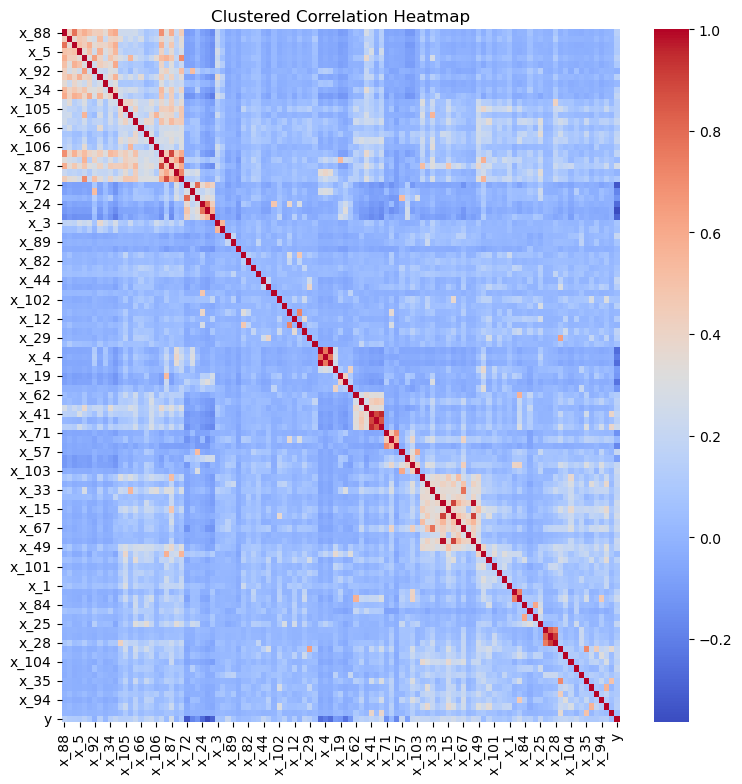

In [16]:
# train_data_reindexed = train_data.reindex_axis(columns, axis=1)
train_data_reindexed = train_data.loc[:, columns]

plt.figure(figsize=(9, 9))
sns.heatmap(train_data_reindexed.corr(), annot=False, cmap='coolwarm')
plt.title('Clustered Correlation Heatmap')
plt.show()

the code below is for an ad-hoc analysis. There is a relatively large mismatch between class 2 and class 3. One can investigate this further if it is needed

In [ ]:

# train_data_sub = train_data[(train_data['y'] == 2) | (train_data['y'] == 3)]
# train_data_sub = train_data_sub.reset_index(drop=True)
# corr_matrix = train_data_sub.corr()
# plt.figure(figsize=(10, 10))
# sns.heatmap(corr_matrix, annot=False, cmap='coolwarm')
# plt.title('Correlation Heatmap')
# plt.show()

In [17]:
train_data[train_data.columns[1:]].corr()['y'][:].sort_values(ascending=False)

y       1.000000
x_87    0.261362
x_50    0.253853
x_76    0.241530
x_53    0.235274
          ...   
x_81   -0.258775
x_24   -0.265928
x_47   -0.293908
x_72   -0.330005
x_11   -0.365018
Name: y, Length: 108, dtype: float64

## Feature Engineering

### Variance Threshold

One can change the threshold value and see the results accordingly 

In [18]:
X = train_data.iloc[:,0:107]
vt = VarianceThreshold(threshold=0.045) ### !!!!!!!!!!
vt.fit(X)

# find the features that meet the variance threshold
mask = vt.get_support()
chosen_features = list(X.loc[:, mask].columns)
removed_features = [feature for feature in X.columns if feature not in chosen_features]

# show the chosen and removed features
print('Chosen features: ', chosen_features)
print('Removed features: ', removed_features)

Chosen features:  ['x_2', 'x_4', 'x_6', 'x_7', 'x_8', 'x_9', 'x_10', 'x_11', 'x_12', 'x_13', 'x_14', 'x_15', 'x_16', 'x_17', 'x_19', 'x_20', 'x_21', 'x_23', 'x_24', 'x_25', 'x_26', 'x_27', 'x_28', 'x_29', 'x_30', 'x_31', 'x_32', 'x_33', 'x_35', 'x_36', 'x_37', 'x_38', 'x_39', 'x_40', 'x_41', 'x_43', 'x_44', 'x_45', 'x_46', 'x_47', 'x_49', 'x_50', 'x_52', 'x_53', 'x_54', 'x_55', 'x_56', 'x_57', 'x_58', 'x_59', 'x_60', 'x_62', 'x_64', 'x_66', 'x_67', 'x_68', 'x_69', 'x_70', 'x_71', 'x_72', 'x_73', 'x_74', 'x_75', 'x_76', 'x_77', 'x_78', 'x_80', 'x_81', 'x_83', 'x_84', 'x_85', 'x_86', 'x_87', 'x_88', 'x_89', 'x_90', 'x_92', 'x_93', 'x_94', 'x_97', 'x_98', 'x_100', 'x_101', 'x_102', 'x_103', 'x_104', 'x_105', 'x_107']
Removed features:  ['x_1', 'x_3', 'x_5', 'x_18', 'x_22', 'x_34', 'x_42', 'x_48', 'x_51', 'x_61', 'x_63', 'x_65', 'x_79', 'x_82', 'x_91', 'x_95', 'x_96', 'x_99', 'x_106']


If you want to remove the features which were determined above, you may want to change the key to "True" below

In [ ]:
if(False):    
    test_data = test_data[chosen_features]
    print(len(chosen_features))
    chosen_features.append('y')
    print(len(chosen_features))
    train_data = train_data[chosen_features]
     

### TSNE

The main motivation adding using this approach is to add some new features to the current dataset. By checking the performance of the used ml techniques, we can end up with an result whether this approach is useful in terms of accuracy or some other performance measure. 

Another reason to employ this technique is to visualize our dataset in two and three dimensions. By looking at the visuals, one can easily observe that class 2 and class 3 are showing similar features. One can also see this behaviour is looking at the confusion matrices of the used machine learning techniques. 

**Probably this won't finish immmediately**. You may want to check the details of this feature reduction technique. Here were trying to achieve some useful features by using this technique.

#### with 2 Dimensions

In [ ]:
X_train_tsne = TSNE(n_components=2, learning_rate="auto", perplexity=100, verbose=1).fit_transform(train_data.drop(['y'], axis = 1))

In [ ]:
if(False):
    print(type(X_train_tsne))
    # convert X_tsne to dataframe
    X_tsne_train_df = pd.DataFrame(X_train_tsne)
    #X_tsne_test_df = pd.DataFrame(X_test_tsne)
    # add X_tsne_df to train_data and test_data by changing the column names as tsn1_1 and tsn1_2
    train_data['tsn1_1'] = X_tsne_train_df[0] 
    train_data['tsn1_2'] = X_tsne_train_df[1]
    #test_data['tsn1_1'] = X_tsne_test_df[0]
    #test_data['tsn1_2'] = X_tsne_test_df[1]   
print('Shape of train_data: ', train_data.shape)

In [ ]:
plt.figure(figsize=(10, 8))

plt.scatter(X_train_tsne[:, 0], X_train_tsne[:, 1], c=train_data['y'], s=4)

#### with 3 Dimensions

The code below took approximately 20 minutes to run. This value can change depending on the computer you are using.

In [19]:
X_train_tsne_3d = TSNE(n_components=3, learning_rate="auto", perplexity=100, verbose=1).fit_transform(train_data.drop(['y'], axis = 1))

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 62500 samples in 0.047s...
[t-SNE] Computed neighbors for 62500 samples in 11.333s...
[t-SNE] Computed conditional probabilities for sample 1000 / 62500
[t-SNE] Computed conditional probabilities for sample 2000 / 62500
[t-SNE] Computed conditional probabilities for sample 3000 / 62500
[t-SNE] Computed conditional probabilities for sample 4000 / 62500
[t-SNE] Computed conditional probabilities for sample 5000 / 62500
[t-SNE] Computed conditional probabilities for sample 6000 / 62500
[t-SNE] Computed conditional probabilities for sample 7000 / 62500
[t-SNE] Computed conditional probabilities for sample 8000 / 62500
[t-SNE] Computed conditional probabilities for sample 9000 / 62500
[t-SNE] Computed conditional probabilities for sample 10000 / 62500
[t-SNE] Computed conditional probabilities for sample 11000 / 62500
[t-SNE] Computed conditional probabilities for sample 12000 / 62500
[t-SNE] Computed conditional probabilities for s

The visualization below is interactive so you can open or close whichever class you want to see or hide.

In [20]:
# combine X_tsne with the y column of train_data
X_tsne_df = pd.DataFrame(X_train_tsne_3d)
X_tsne_df['y'] = train_data['y']
X_tsne_df.columns = ['f1','f2','f3','y']
X_tsne_df["y"] = X_tsne_df["y"].astype(str)

fig = px.scatter_3d(X_tsne_df, x='f1', y='f2', z='f3',color='y')
fig.update_traces(marker=dict(size=5))
fig.show()

## Train and Test Split

The code below is dividing the train data set into two subsets which are called train and test-more precisely validation- data sets. The percentage can be changed easily in the arguments. Here 80%-20% has been used for respectivelly train and test. 

One can also add cross validation approach here. Such as k-fold cross validation. 

In [21]:
X = train_data.drop(['y'], axis = 1)
y = train_data['y']
number_f_class = len(y.unique())
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 13)
print("number of classes: ", number_f_class)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

number of classes:  9
(50000, 108) (12500, 108) (50000,) (12500,)


## Machine Learning Models

### K-nearest Classifier

In [22]:
log_los_values = []
for i in range(160,162):
    knn = KNeighborsClassifier(n_neighbors=i).fit(X_train, y_train)
    predicted_test = knn.predict(X_test)
    y_proba = knn.predict_proba(X_test)
    log_loss_value = log_loss(y_test, y_proba)
    print("step ", i, " log loss: ", log_loss_value)

step  160  log loss:  0.6947396640209894
step  161  log loss:  0.695191683735516


Accuracy_train: 0.73992
Accuracy_test: 0.74408


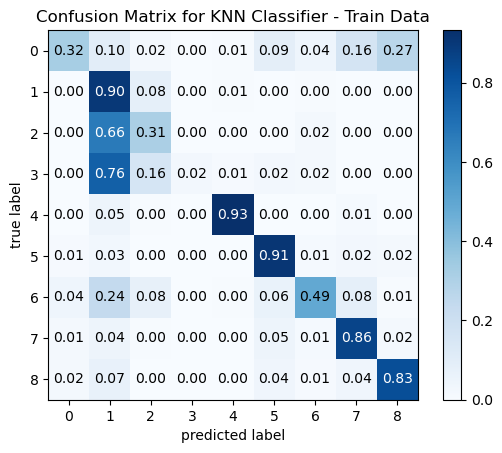

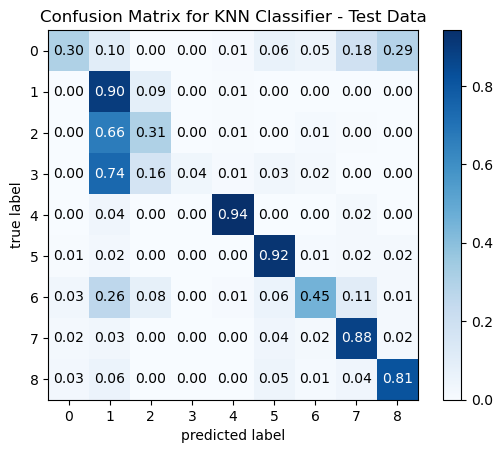

<class 'numpy.float64'>
knn Log Loss: 0.6928896233678563


In [23]:
knn = KNeighborsClassifier(n_neighbors = 150).fit(X_train, y_train) 

predicted = knn.predict(X_test)
predicted_train = knn.predict(X_train)

accuracy_train = accuracy_score(predicted_train, y_train)
accuracy_test = accuracy_score(predicted, y_test)

print(f'Accuracy_train: {accuracy_train}')
print(f'Accuracy_test: {accuracy_test}')

fig, ax = plot_confusion_matrix(conf_mat=confusion_matrix(y_train, predicted_train),
                                colorbar=True,
                                show_absolute=False,
                                show_normed=True)
plt.title('Confusion Matrix for KNN Classifier - Train Data')
plt.show()


fig, ax = plot_confusion_matrix(conf_mat=confusion_matrix(y_test, predicted),
                                colorbar=True,
                                show_absolute=False,
                                show_normed=True)
plt.title('Confusion Matrix for KNN Classifier - Test Data')
plt.show()

y_proba = knn.predict_proba(X_test)

# Evaluate the log loss of the stacking classifier (for probabilistic predictions)
log_loss_value = log_loss(y_test, y_proba)
print(type(log_loss_value))
print(f"knn Log Loss: {log_loss_value}")

### Logistic Regression

Accuracy_train: 0.76576
Accuracy_test: 0.76632


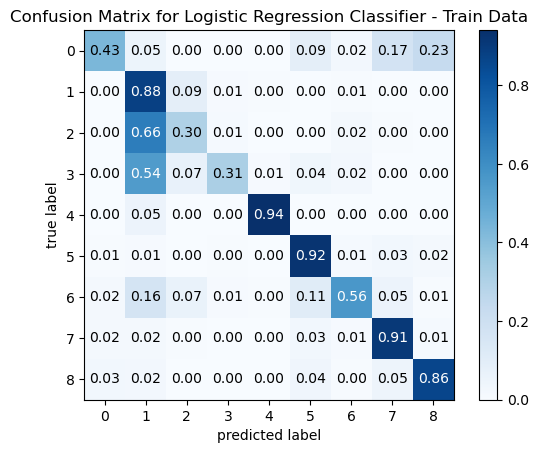

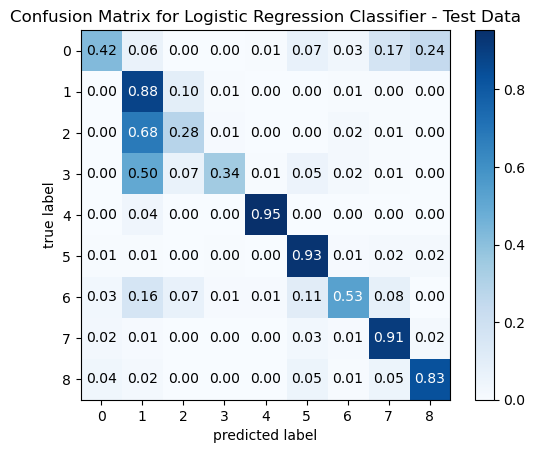

logistic regression Log Loss: 0.6320746415766074


In [24]:
# all parameters not specified are set to their defaults
logisticRegr = LogisticRegression()
logisticRegr.fit(X_train, y_train)

predicted = logisticRegr.predict(X_test)
predicted_train = logisticRegr.predict(X_train)

accuracy_train = accuracy_score(predicted_train, y_train)
accuracy_test = accuracy_score(predicted, y_test)

print(f'Accuracy_train: {accuracy_train}')
print(f'Accuracy_test: {accuracy_test}')

fig, ax = plot_confusion_matrix(conf_mat=confusion_matrix(y_train, predicted_train),
                                colorbar=True,
                                show_absolute=False,
                                show_normed=True)
plt.title('Confusion Matrix for Logistic Regression Classifier - Train Data')
plt.show()


fig, ax = plot_confusion_matrix(conf_mat=confusion_matrix(y_test, predicted),
                                colorbar=True,
                                show_absolute=False,
                                show_normed=True)
plt.title('Confusion Matrix for Logistic Regression Classifier - Test Data')
plt.show()

y_proba = logisticRegr.predict_proba(X_test)

# Evaluate the log loss of the stacking classifier (for probabilistic predictions)
log_loss_value = log_loss(y_test, y_proba)
print(f"logistic regression Log Loss: {log_loss_value}")

### Naive Bayes Classifier

Accuracy_train: 0.62322
Accuracy_test: 0.63096


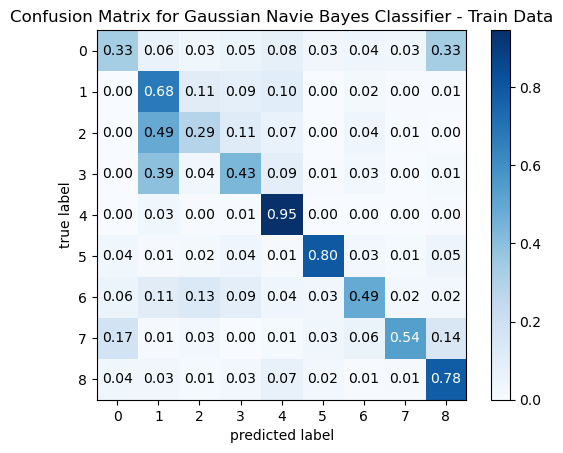

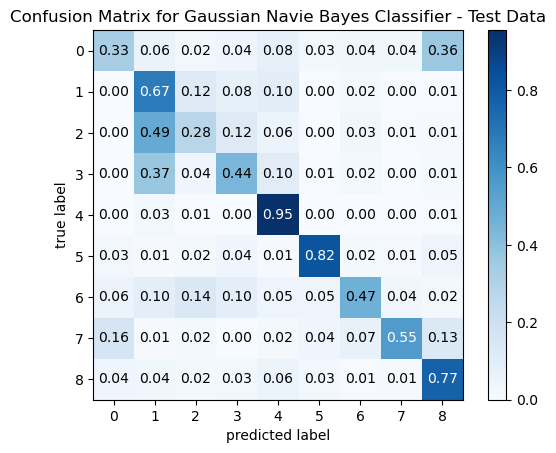

In [25]:
gnb = GaussianNB().fit(X_train, y_train) 
predicted = gnb.predict(X_test)
predicted_train = gnb.predict(X_train)

accuracy_train = accuracy_score(predicted_train, y_train)
accuracy_test = accuracy_score(predicted, y_test)

print(f'Accuracy_train: {accuracy_train}')
print(f'Accuracy_test: {accuracy_test}')

fig, ax = plot_confusion_matrix(conf_mat=confusion_matrix(y_train, predicted_train),
                                colorbar=True,
                                show_absolute=False,
                                show_normed=True)
plt.title('Confusion Matrix for Gaussian Navie Bayes Classifier - Train Data')
plt.show()


fig, ax = plot_confusion_matrix(conf_mat=confusion_matrix(y_test, predicted),
                                colorbar=True,
                                show_absolute=False,
                                show_normed=True)
plt.title('Confusion Matrix for Gaussian Navie Bayes Classifier - Test Data')
plt.show()

### SVM - RBF (Radial Basis Function)

In a support vector machine (SVM), C and gamma are parameters that help to determine the shape of the decision boundary that separates the different classes in the data. C is a regularization parameter that controls the trade-off between achieving a low training error and a low testing error. A smaller value of C creates a wider margin and allows more training errors, while a larger value of C creates a narrower margin and penalizes training errors more heavily.Gamma, on the other hand, determines the shape of the decision boundary. It defines the influence of a single training example and how far the influence of each example reaches. A small gamma results in a more generalized decision boundary, while a large gamma results in a more complex decision boundary that can potentially overfit the training data.

from ChatGPT

The code below will take some time to be completed. Approximately 15 minutes depending on the computer you are using.

In [ ]:
svm_model_linear = SVC(kernel = 'rbf', C = 1, probability=True).fit(X_train, y_train) 
svm_predictions = svm_model_linear.predict(X_test) 

svm_predictions_train = svm_model_linear.predict(X_train)

# model accuracy for X_train
accuracy_svmlinear_train = svm_model_linear.score(X_train, y_train) 

# model accuracy for X_test   
accuracy_svmlinear_test = svm_model_linear.score(X_test, y_test) 

print(f'Accuracy_train: {accuracy_svmlinear_train}')
print(f'Accuracy_test: {accuracy_svmlinear_test}')

In [ ]:
print(confusion_matrix(y_test, svm_predictions))
print(confusion_matrix(y_train, svm_predictions_train))
y_proba = svm_model_linear.predict_proba(X_test)

# Evaluate the log loss of the stacking classifier (for probabilistic predictions)
log_loss_value = log_loss(y_test, y_proba)
print(f"logistic regression Log Loss: {log_loss_value}")

### Decision Tree Model

In [26]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [15, 17, 19, 21, 23, 25, 30],
    'min_samples_leaf': [50, 100, 200, 5000, 1000],
    'criterion': ["gini", "entropy"]
}

In [27]:
# Instantiate the grid search model
LogLoss = make_scorer(log_loss, greater_is_better=False, needs_proba=True) #this is needed to compare models by their log losses
grid_search = GridSearchCV(estimator= DecisionTreeClassifier(), 
                           param_grid=params, 
                           cv=4, n_jobs=-1, verbose=1, scoring = LogLoss)

In [28]:
grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 70 candidates, totalling 280 fits


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [15, 17, 19, 21, 23, 25, 30],
                         'min_samples_leaf': [50, 100, 200, 5000, 1000]},
             scoring=make_scorer(log_loss, greater_is_better=False, needs_proba=True),
             verbose=1)

In [29]:
grid_search.best_estimator_

DecisionTreeClassifier(max_depth=21, min_samples_leaf=200)

In [30]:
score_df = pd.DataFrame(grid_search.cv_results_)
score_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,1.478035,0.009657,0.029958,0.001853,gini,15,50,"{'criterion': 'gini', 'max_depth': 15, 'min_sa...",-1.242390,-1.198905,-1.255056,-1.294162,-1.247628,0.033993,43
1,1.315421,0.006578,0.027044,0.003908,gini,15,100,"{'criterion': 'gini', 'max_depth': 15, 'min_sa...",-1.073747,-1.094810,-1.207718,-1.132972,-1.127312,0.051046,15
2,1.046113,0.010916,0.028258,0.001266,gini,15,200,"{'criterion': 'gini', 'max_depth': 15, 'min_sa...",-1.070696,-1.064629,-1.104588,-1.039059,-1.069743,0.023360,7
3,0.329818,0.008650,0.030304,0.003000,gini,15,5000,"{'criterion': 'gini', 'max_depth': 15, 'min_sa...",-1.576227,-1.563925,-1.569188,-1.571817,-1.570289,0.004453,64
4,0.657682,0.017150,0.030068,0.002936,gini,15,1000,"{'criterion': 'gini', 'max_depth': 15, 'min_sa...",-1.153849,-1.146679,-1.146011,-1.136511,-1.145762,0.006162,22


In [31]:
score_df.nlargest(5,"mean_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
17,1.011893,0.018009,0.026662,0.001969,gini,21,200,"{'criterion': 'gini', 'max_depth': 21, 'min_sa...",-1.076535,-1.054008,-1.097860,-1.032641,-1.065261,0.024395,1
22,1.050972,0.014181,0.027228,0.002130,gini,23,200,"{'criterion': 'gini', 'max_depth': 23, 'min_sa...",-1.076535,-1.054008,-1.097860,-1.032641,-1.065261,0.024395,1
27,1.012322,0.015921,0.025691,0.000810,gini,25,200,"{'criterion': 'gini', 'max_depth': 25, 'min_sa...",-1.076535,-1.054008,-1.097860,-1.032641,-1.065261,0.024395,1
32,1.089790,0.015983,0.028028,0.002127,gini,30,200,"{'criterion': 'gini', 'max_depth': 30, 'min_sa...",-1.076535,-1.054008,-1.097860,-1.032641,-1.065261,0.024395,1
7,1.000617,0.009660,0.027236,0.001449,gini,17,200,"{'criterion': 'gini', 'max_depth': 17, 'min_sa...",-1.076482,-1.051085,-1.098773,-1.034736,-1.065269,0.024401,5


In [32]:
grid_search.best_estimator_

DecisionTreeClassifier(max_depth=21, min_samples_leaf=200)

Accuracy_train: 0.72648
Accuracy_test: 0.70784
Decision Tree Log Loss: 1.1861204374132897


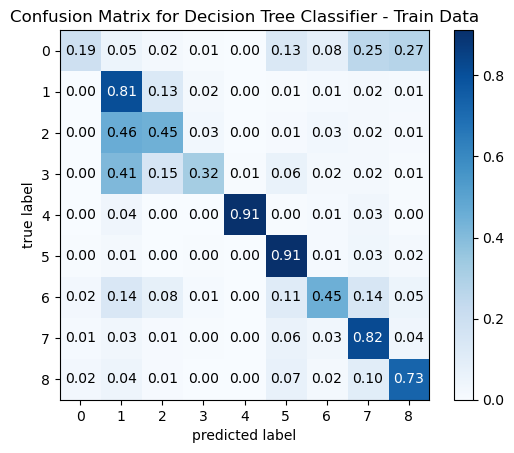

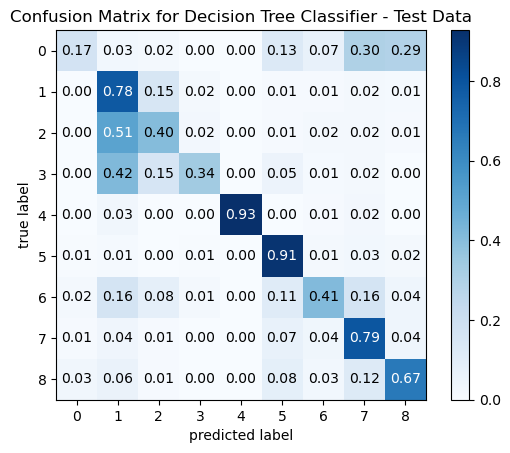

In [33]:
#class_weights = {1: 1, 2: 1, 3: 2, 4:1, 5:1, 6:1, 7:1, 8:1, 9:1}
d_tree = DecisionTreeClassifier(random_state = 15, max_depth = 21, min_samples_split = 200, criterion="entropy")
d_tree.fit(X_train, y_train)
predicted = d_tree.predict(X_test)
predicted_train = d_tree.predict(X_train)
accuracy_train = accuracy_score(predicted_train, y_train)
accuracy_test = accuracy_score(predicted, y_test)
print(f'Accuracy_train: {accuracy_train}')
print(f'Accuracy_test: {accuracy_test}')
y_proba = d_tree.predict_proba(X_test)

# Evaluate the log loss of the stacking classifier (for probabilistic predictions)
log_loss_value = log_loss(y_test, y_proba)
print(f"Decision Tree Log Loss: {log_loss_value}")

fig, ax = plot_confusion_matrix(conf_mat=confusion_matrix(y_train, predicted_train),
                                colorbar=True,
                                show_absolute=False,
                                show_normed=True)
plt.title('Confusion Matrix for Decision Tree Classifier - Train Data')
plt.show()


fig, ax = plot_confusion_matrix(conf_mat=confusion_matrix(y_test, predicted),
                                colorbar=True,
                                show_absolute=False,
                                show_normed=True)
plt.title('Confusion Matrix for Decision Tree Classifier - Test Data')
plt.show()

In [ ]:
#classes = [str(x) for x in train_data['y'].unique().tolist()]
#fig = plt.figure(figsize = (20, ))
#_ = tree.plot_tree(model, feature_names = X.columns.values.tolist(),class_names = classes, filled = True)
#fig.savefig("decision_tree.png")

### Balanced Bagging Classifier

Accuracy_train: 0.8652
Accuracy_test: 0.7508
Balanced Bagging Classifier Log Loss: 2.3180493403324225


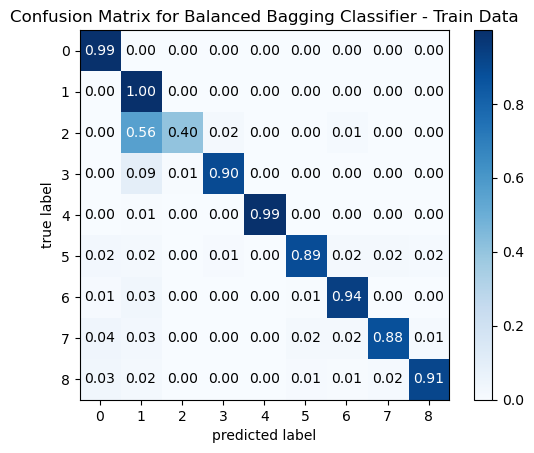

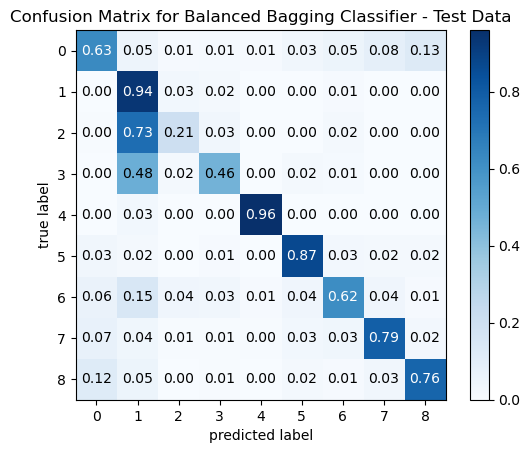

In [34]:
from imblearn.ensemble import BalancedBaggingClassifier
from sklearn.tree import DecisionTreeClassifier
#Create an instance
baggingClassifier = BalancedBaggingClassifier(
                                sampling_strategy='not majority',
                                replacement=False,
                                random_state=12)
baggingClassifier.fit(X_train, y_train)
predicted = baggingClassifier.predict(X_test)
predicted_train = baggingClassifier.predict(X_train)
accuracy_train = accuracy_score(predicted_train, y_train)
accuracy_test = accuracy_score(predicted, y_test)
print(f'Accuracy_train: {accuracy_train}')
print(f'Accuracy_test: {accuracy_test}')
y_proba = baggingClassifier.predict_proba(X_test)

log_loss_value = log_loss(y_test, y_proba)
print(f"Balanced Bagging Classifier Log Loss: {log_loss_value}")

fig, ax = plot_confusion_matrix(conf_mat=confusion_matrix(y_train, predicted_train),
                                colorbar=True,
                                show_absolute=False,
                                show_normed=True)
plt.title('Confusion Matrix for Balanced Bagging Classifier - Train Data')
plt.show()


fig, ax = plot_confusion_matrix(conf_mat=confusion_matrix(y_test, predicted),
                                colorbar=True,
                                show_absolute=False,
                                show_normed=True)
plt.title('Confusion Matrix for Balanced Bagging Classifier - Test Data')
plt.show()



### LightGBM Model

This technique gave the best results comparing with the other models. Because of the promising results, I decided to optimize hyperparamters of the lightgbm model by using the optuna library.

#### Model

In [35]:
def objective(trial):
    """
    Objective function to be minimized.
    """
    param = {
        "objective": "multiclass",
        "metric": "multi_logloss",
        "verbosity": -1,
        "boosting_type": "gbdt",
        "num_class": number_f_class,
        "lambda_l1": trial.suggest_float("lambda_l1", 1e-8, 10.0, log=True),
        "lambda_l2": trial.suggest_float("lambda_l2", 1e-8, 10.0, log=True),
        "num_leaves": trial.suggest_int("num_leaves", 16, 256),
        "feature_fraction": trial.suggest_float("feature_fraction", 0.4, 1.0),
        "bagging_fraction": trial.suggest_float("bagging_fraction", 0.4, 1.0),
        "bagging_freq": trial.suggest_int("bagging_freq", 1, 7),
        "min_child_samples": trial.suggest_int("min_child_samples", 5, 100),
    }

    gbm = lgb.LGBMClassifier(**param)
    gbm.fit(X_train, y_train)
    y_proba = gbm.predict_proba(X_test)
    log_loss_value = log_loss(y_test, y_proba)
    return log_loss_value
    #preds = gbm.predict(X_test)
    #accuracy_test = accuracy_score(y_test, preds)
    #return accuracy_test

You can increase the n_trials belows to try more/less trials.

In [36]:

#this part has already been run and we took the required results which are the best parameters
sampler = TPESampler(seed=10)
study = optuna.create_study(study_name="lightgbm", direction="minimize", sampler=sampler)
study.optimize(objective, n_trials=20)
print('Best parameters:', study.best_params)
print('Best value:', study.best_value)
print('Best trial:', study.best_trial)

[I 2024-08-31 12:17:37,353] A new study created in memory with name: lightgbm
[I 2024-08-31 12:17:49,385] Trial 0 finished with value: 0.46150145177234575 and parameters: {'lambda_l1': 0.08747537025773001, 'lambda_l2': 1.537331564587801e-08, 'num_leaves': 168, 'feature_fraction': 0.8492823295231671, 'bagging_fraction': 0.6991042073815543, 'bagging_freq': 2, 'min_child_samples': 24}. Best is trial 0 with value: 0.46150145177234575.
[I 2024-08-31 12:17:53,931] Trial 1 finished with value: 0.46856775433995607 and parameters: {'lambda_l1': 0.0699481785242808, 'lambda_l2': 3.32657660618516e-07, 'num_leaves': 37, 'feature_fraction': 0.8112158910206784, 'bagging_fraction': 0.972036007716962, 'bagging_freq': 1, 'min_child_samples': 54}. Best is trial 0 with value: 0.46150145177234575.
[I 2024-08-31 12:18:09,994] Trial 2 finished with value: 0.4504958247525381 and parameters: {'lambda_l1': 0.20586790968905005, 'lambda_l2': 0.003256376421394008, 'num_leaves': 189, 'feature_fraction': 0.575125640

Best parameters: {'lambda_l1': 2.3977611919263013e-05, 'lambda_l2': 1.5172998163265026, 'num_leaves': 229, 'feature_fraction': 0.48323567241655535, 'bagging_fraction': 0.8208273394862039, 'bagging_freq': 6, 'min_child_samples': 65}
Best value: 0.44451152632292257
Best trial: FrozenTrial(number=17, state=TrialState.COMPLETE, values=[0.44451152632292257], datetime_start=datetime.datetime(2024, 8, 31, 12, 20, 59, 745226), datetime_complete=datetime.datetime(2024, 8, 31, 12, 21, 15, 344751), params={'lambda_l1': 2.3977611919263013e-05, 'lambda_l2': 1.5172998163265026, 'num_leaves': 229, 'feature_fraction': 0.48323567241655535, 'bagging_fraction': 0.8208273394862039, 'bagging_freq': 6, 'min_child_samples': 65}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'lambda_l1': FloatDistribution(high=10.0, log=True, low=1e-08, step=None), 'lambda_l2': FloatDistribution(high=10.0, log=True, low=1e-08, step=None), 'num_leaves': IntDistribution(high=256, log=False, low=16, step

#### Hyperparameter Tuning

In [37]:
fig1 = optuna.visualization.plot_optimization_history(study)
fig1.show()

In [38]:
fig2 = optuna.visualization.plot_slice(study)
fig2.show()

In [39]:
# Plotting Parameter Importance
param_importance_plot = optuna.visualization.plot_param_importances(study)
param_importance_plot.show()

In [40]:
fig4 = optuna.visualization.plot_parallel_coordinate(study)
fig4.show()

In [41]:
# Get parameters sorted by the importance values
importances = optuna.importance.get_param_importances(study)
params_sorted = list(importances.keys())

# Plot
fig = optuna.visualization.plot_rank(study, params=params_sorted[:8])
fig.show()

In [42]:
fig6 = optuna.visualization.plot_contour(study, params=['feature_fraction','lambda_l1'])
fig6.show()

In [43]:
# these are the best parameters that have been found by optuna
# best_parameters = {'lambda_l1': 5.117571145089835e-06, 'lambda_l2': 0.08753895882464374, 'num_leaves': 199, 'feature_fraction': 0.606773610653303, 'bagging_fraction': 0.8462643326394661, 'bagging_freq': 2, 'min_child_samples': 89}
# best_parameters = {'lambda_l1': 0.128070987555928, 'lambda_l2': 3.1488957830792917e-06, 'num_leaves': 180, 'feature_fraction': 0.6302482400741398, 'bagging_fraction': 0.9979000611889808, 'bagging_freq': 2, 'min_child_samples': 66}

#lgbm = lgb.LGBMClassifier(**best_parameters)
lgbm = lgb.LGBMClassifier(**study.best_params)
lgbm.fit(X_train, y_train)

[LightGBM] [Warning] lambda_l1 is set=2.3977611919263013e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3977611919263013e-05
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.48323567241655535, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.48323567241655535
[LightGBM] [Warning] bagging_fraction is set=0.8208273394862039, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8208273394862039
[LightGBM] [Warning] lambda_l2 is set=1.5172998163265026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5172998163265026
[LightGBM] [Warning] lambda_l1 is set=2.3977611919263013e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3977611919263013e-05
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.48323567241655535,

LGBMClassifier(bagging_fraction=0.8208273394862039, bagging_freq=6,
               feature_fraction=0.48323567241655535,
               lambda_l1=2.3977611919263013e-05, lambda_l2=1.5172998163265026,
               min_child_samples=65, num_leaves=229)

[LightGBM] [Warning] lambda_l1 is set=2.3977611919263013e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3977611919263013e-05
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.48323567241655535, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.48323567241655535
[LightGBM] [Warning] bagging_fraction is set=0.8208273394862039, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8208273394862039
[LightGBM] [Warning] lambda_l2 is set=1.5172998163265026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5172998163265026
[LightGBM] [Warning] lambda_l1 is set=2.3977611919263013e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3977611919263013e-05
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.48323567241655535,

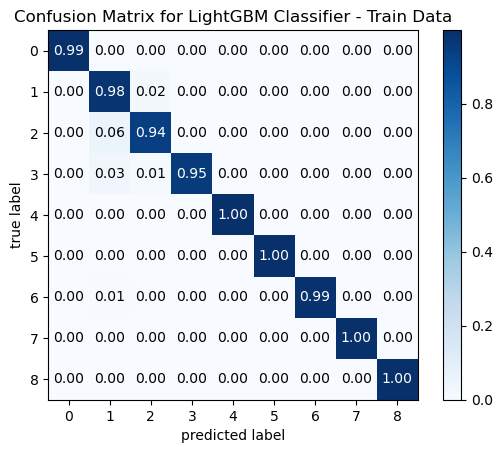

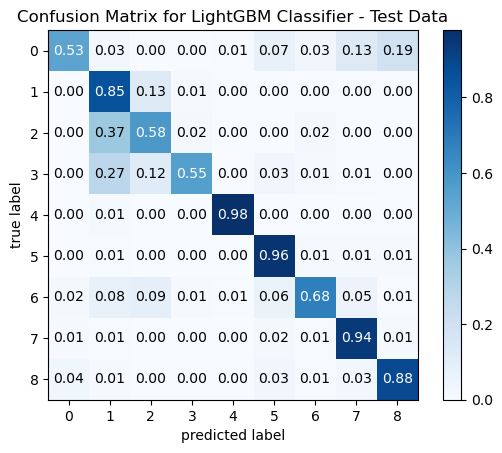

In [44]:
predicted_test = lgbm.predict(X_test)
predicted_train = lgbm.predict(X_train)
accuracy_train = accuracy_score(predicted_train, y_train)
accuracy_test = accuracy_score(predicted_test, y_test)
print(f'Accuracy_train: {accuracy_train}')
print(f'Accuracy_test: {accuracy_test}')

y_proba = lgbm.predict_proba(X_test)

# Evaluate the log loss of the stacking classifier (for probabilistic predictions)
log_loss_value = log_loss(y_test, y_proba)
print(f"LGBMC Log Loss: {log_loss_value}")

fig, ax = plot_confusion_matrix(conf_mat=confusion_matrix(y_train, predicted_train),
                                colorbar=True,
                                show_absolute=False,
                                show_normed=True)
plt.title('Confusion Matrix for LightGBM Classifier - Train Data')
plt.show()


fig, ax = plot_confusion_matrix(conf_mat=confusion_matrix(y_test, predicted_test),
                                colorbar=True,
                                show_absolute=False,
                                show_normed=True)
plt.title('Confusion Matrix for LightGBM Classifier - Test Data')
plt.show()

#### Importance of Features

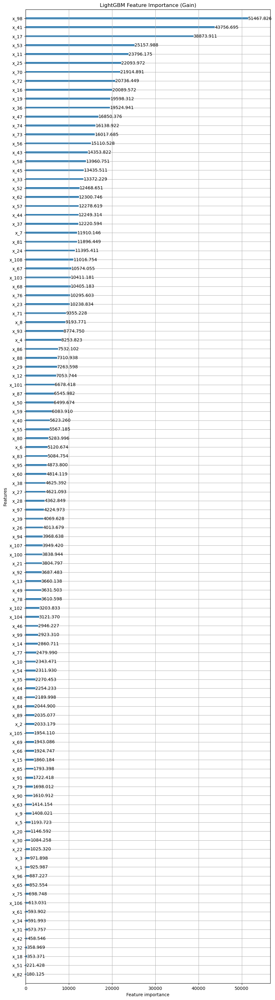

In [45]:
lgb.plot_importance(lgbm, importance_type="gain", figsize=(10,40), title="LightGBM Feature Importance (Gain)")
plt.show()

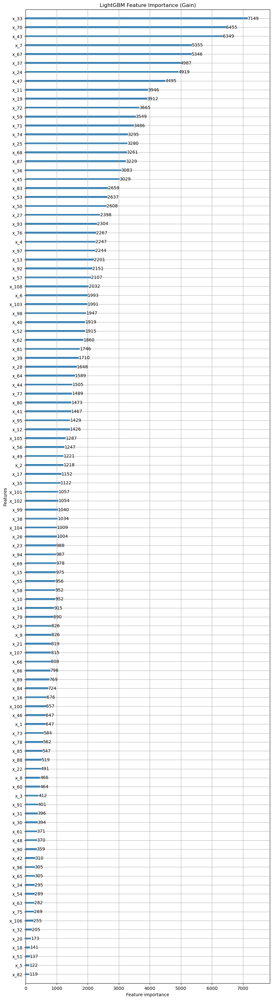

In [46]:
lgb.plot_importance(lgbm, importance_type="split", figsize=(10,40), title="LightGBM Feature Importance (Gain)")
plt.show()